<a href="https://colab.research.google.com/github/SAMashiyane/ANN_Salary/blob/main/chalenge_example.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# from jupyterthemes import get_themes
# import jupyterthemes as jt
# from jupyterthemes.stylefx import set_nb_theme

In [ ]:
# set_nb_theme('monokai')

In [ ]:
!nvidia-smi

Sun Jan 23 05:00:03 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 495.46       Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   52C    P8    10W /  70W |      0MiB / 15109MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
import torch.backends.cudnn as cudnn
import glob
import cv2
import shutil

import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

import torchvision
import torchvision.transforms as transforms
import torchvision.datasets as datasets
from torch.utils.data import DataLoader,Dataset
from torchvision.models import resnet18, resnet34 ,resnet50
import os

In [ ]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
best_acc = 0  # best test accuracy
start_epoch = 0  # start from epoch 0 or last checkpoint epoch
use_gpu = torch.cuda.is_available()

In [ ]:
use_gpu

True

## **Data**

- upload my dataset from google drive
- unzip dataset
- train: learning the **parameters** of the model.
- valid: learning **hyper-parameters**.
- development
- show example image from dataset 

In [ ]:
# DATA_DIR = r"C:\Users\Salio\Desktop\recognition\datasets"
# DATA_DIR ="C:/Users/Salio/Desktop/recognition-challenge/"
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
!unzip "/content/gdrive/MyDrive/recognition.zip" -d "/content/challenge"

Streaming output truncated to the last 5000 lines.
  inflating: /content/challenge/recognition/datasets/valid/n03355925/val_9854.JPEG  
  inflating: /content/challenge/recognition/datasets/valid/n03355925/val_9920.JPEG  
   creating: /content/challenge/recognition/datasets/valid/n03388043/
  inflating: /content/challenge/recognition/datasets/valid/n03388043/val_1099.JPEG  
  inflating: /content/challenge/recognition/datasets/valid/n03388043/val_1157.JPEG  
  inflating: /content/challenge/recognition/datasets/valid/n03388043/val_1162.JPEG  
  inflating: /content/challenge/recognition/datasets/valid/n03388043/val_1198.JPEG  
  inflating: /content/challenge/recognition/datasets/valid/n03388043/val_1244.JPEG  
  inflating: /content/challenge/recognition/datasets/valid/n03388043/val_1604.JPEG  
  inflating: /content/challenge/recognition/datasets/valid/n03388043/val_2185.JPEG  
  inflating: /content/challenge/recognition/datasets/valid/n03388043/val_2246.JPEG  
  inflating: /content/challen

In [ ]:
DATA_DIR = "/content/challenge/recognition/datasets"

In [ ]:
os.listdir(DATA_DIR)

['trains', 'valid']

In [ ]:
trn_dir = "/content/challenge/recognition/datasets/trains"
val_dir = "/content/challenge/recognition/datasets/valid"

In [ ]:
trn_fnames = glob.glob(f'{trn_dir}/*/*/*.JPEG')
trn_fnames[:5]

['/content/challenge/recognition/datasets/trains/n01882714/images/n01882714_178.JPEG',
 '/content/challenge/recognition/datasets/trains/n01882714/images/n01882714_440.JPEG',
 '/content/challenge/recognition/datasets/trains/n01882714/images/n01882714_256.JPEG',
 '/content/challenge/recognition/datasets/trains/n01882714/images/n01882714_245.JPEG',
 '/content/challenge/recognition/datasets/trains/n01882714/images/n01882714_131.JPEG']

(64, 64, 3)

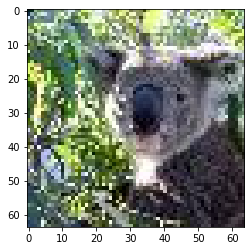

In [ ]:
img = plt.imread(trn_fnames[9])
plt.imshow(img);
img.shape

# Transforms and  Datasets and Dataloaders in PyTorch

In [ ]:
# image size = 64 * 64 
transform_train = transforms.Compose([
    transforms.RandomCrop(32, padding=4),  # PIL Image
    transforms.RandomHorizontalFlip(),   # PIL Image
    transforms.ToTensor(), #  # Tensor
    transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010)),
])

transform_valid = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010)),
    ])


In [ ]:
train_ds = datasets.ImageFolder(trn_dir, transform=transform_train)
valid_ds = datasets.ImageFolder(val_dir, transform=transform_valid)

In [ ]:
len(train_ds), len(valid_ds)

(100000, 10000)

In [ ]:
batch_size =128


train_dl = torch.utils.data.DataLoader(train_ds, batch_size=batch_size, 
                                       shuffle=True, num_workers=2)
valid_dl = torch.utils.data.DataLoader(valid_ds, batch_size=batch_size, 
                                       shuffle=True, num_workers=2)
print(len(train_dl))
print(len(train_ds)//batch_size)

782
781


In [ ]:
batch = next(iter(train_dl))
train_data = batch[0]
print(train_data.shape)

torch.Size([128, 3, 32, 32])


In [ ]:
batch_valid = next(iter(valid_dl))
batch_valid_data = batch_valid[0]
print(batch_valid_data.shape)

torch.Size([128, 3, 64, 64])


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def normalize_image(image):
    image_min = image.min()
    image_max = image.max()
    image.clamp_(min = image_min, max = image_max)
    image.add_(-image_min).div_(image_max - image_min + 1e-5)
    return image

def plot_images(images, labels, classes, normalize=True):

    n_images = len(images)

    rows = int(np.sqrt(n_images))
    cols = int(np.sqrt(n_images))

    fig = plt.figure(figsize=(20, 20))

    for i in range(rows*cols):

        ax = fig.add_subplot(rows, cols, i+1)
        
        image = images[i]

        if normalize:
            image = normalize_image(image)

        ax.imshow(image.permute(1, 2, 0).cpu().numpy())
        ax.set_title(classes[labels[i]])
        ax.axis('off')

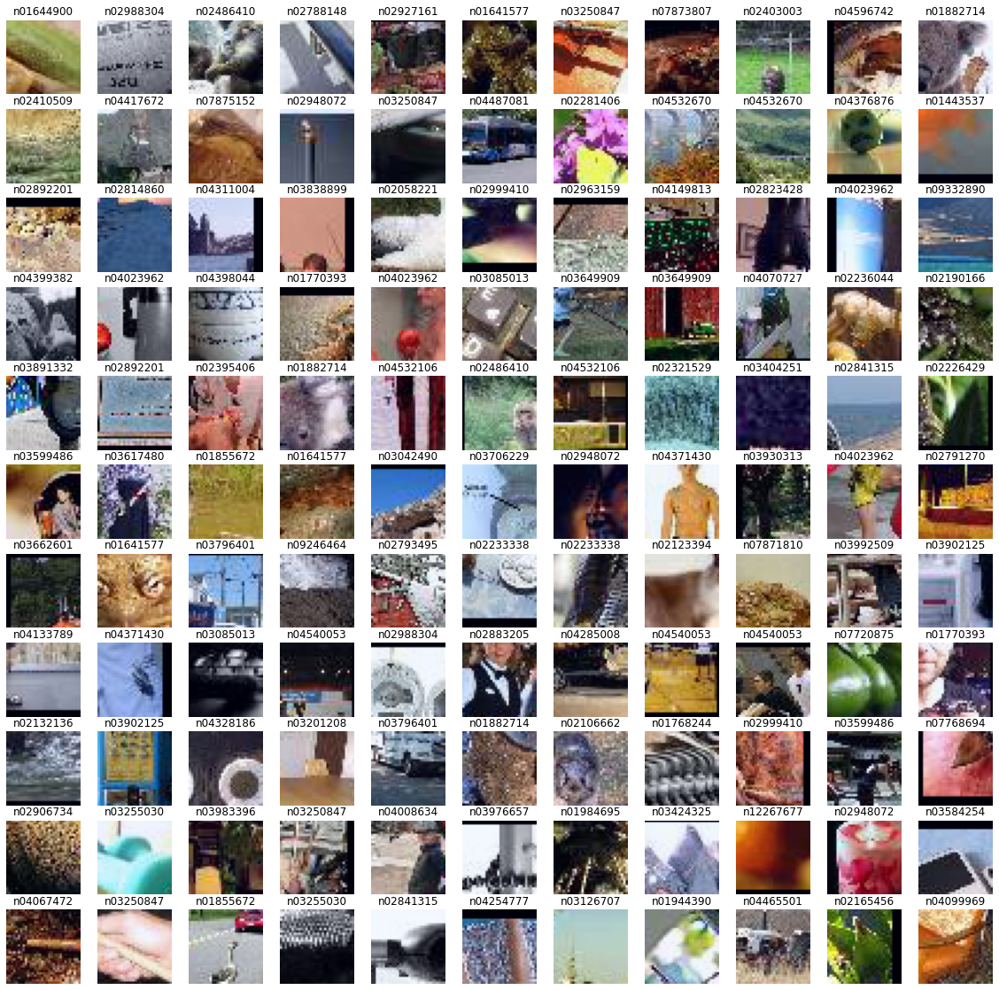

In [ ]:
classes = train_ds.classes
# print(classes)

plot_images(batch[0], batch[1], classes,normalize=True)

In [ ]:
# net = resnet50()
# net.fc = nn.Linear(2048,200)
# net = net.to(device)

## Model 

- resnet50



In [ ]:
net = resnet50()
net.fc = nn.Linear(2048,200)
# net = SimpleCNN()
net = net.to(device)

In [ ]:
def count_parameters(model):
    params = sum(p.numel() for p in model.parameters() if p.requires_grad)
    return params/1000000

In [ ]:
count_parameters(net)

23.917832

## Criterion & Optimizer

In [ ]:
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(net.parameters(), lr=0.01,
                      momentum=0.9, weight_decay=5e-4)
# scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=200)

In [ ]:
y = net(batch[0].to(device))
y.shape

torch.Size([128, 200])

In [ ]:
batch[1].shape

torch.Size([128])

In [ ]:
criterion(y, batch[1].to(device))

tensor(5.7240, device='cuda:0', grad_fn=<NllLossBackward0>)

## Tensorboard 

In [ ]:
from torch.utils.tensorboard import SummaryWriter
import numpy as np

In [ ]:
# try:
#     from google import colab
#     COLAB_ENV = True
# except (ImportError, ModuleNotFoundError):
#     COLAB_ENV = False
COLAB_ENV = True
# Load the TensorBoard notebook extension
if COLAB_ENV:
#     %load_ext tensorboard
    %reload_ext tensorboard
    %tensorboard --logdir runs  --host localhost --port 8088
else:
    print("To use tensorboard, please use this notebook in a Google Colab environment.")

<IPython.core.display.Javascript object>

Average Meter

In [ ]:
class AverageMeter(object):
    """Computes and stores the average and current value"""
    def __init__(self):
        self.reset()

    def reset(self):
        self.val = 0
        self.avg = 0
        self.sum = 0
        self.count = 0

    def update(self, val, n=1):
        self.val = val
        self.sum += val * n
        self.count += n
        self.avg = self.sum / self.count

In [ ]:
pip install torchmetrics

     |████████████████████████████████| 396 kB 7.1 MB/s 


In [ ]:
import logging
logging.getLogger().setLevel(logging.INFO)
logger = logging.getLogger()

In [ ]:
logging.info('This is an info message')
logging.warning('This is a warning message')
logging.error('This is an error message')
logging.critical('This is a critical message')

INFO:root:This is an info message
ERROR:root:This is an error message
CRITICAL:root:This is a critical message


In [ ]:
import time
# time.clock_gettime()

In [ ]:
import sys
import torchmetrics
import logging
logger = logging.getLogger('dataset')
# writer = SummaryWriter('runs/cifar100_resnet18')
writer = SummaryWriter()

In [ ]:
dataloaders ={'train':train_dl,'valid':valid_dl}

In [ ]:
def save_ckp(state, is_best, checkpoint_path, best_model_path):
    
    
    f_path = checkpoint_path
    # save checkpoint data to the path given, checkpoint_path
    torch.save(state, f_path)
    # if it is a best model, min validation loss
    if is_best:
        best_fpath = best_model_path
        # copy that checkpoint file to best path given, best_model_path
        shutil.copyfile(f_path, best_fpath)

In [ ]:
def load_ckp(checkpoint_fpath, model, optimizer):
    # load check point
    checkpoint = torch.load(checkpoint_fpath)
    # initialize state_dict from checkpoint to model--->checkpoint = { 'state_dict': model.state_dict() }  
    # model.load_state_dict(torch.load('model_weights.pth'))      
    model.load_state_dict(checkpoint['state_dict']) # --> model.load_state_dict(model.state_dict())
    # initialize optimizer from checkpoint to optimizer--->checkpoint = { 'optimizer': optimizer.state_dict()}
    optimizer.load_state_dict(checkpoint['optimizer'])
    # initialize valid_loss_min from checkpoint to valid_loss_min
    valid_loss_min = checkpoint['valid_loss_min']
    # return model, optimizer, epoch value, min validation loss 
    return model, optimizer, checkpoint['epoch'], valid_loss_min.item()

In [ ]:
use_cuda = torch.cuda.is_available()

In [ ]:
# Training
def train(start_epoch,end_epoch,valid_loss_min_input, loaders, model, optimizer, criterion, use_cuda, checkpoint_path, best_model_path):
    valid_loss_min= valid_loss_min_input 
    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
    use_cuda = torch.cuda.is_available()
    losses = []

    for epoch in range(start_epoch,end_epoch):
      # initialize variables to monitor training and validation loss
        train_loss = 0.0
        valid_loss = 0.0
        ###################
        # train the model #
        ###################
        model.train()
        loss_total_train = AverageMeter()
        accuracy_train = torchmetrics.Accuracy().cuda()
        for batch_idx, (inputs, targets) in enumerate(dataloaders['train']):
          #move to GPU:
            if use_cuda:   
                inputs, targets = inputs.cuda(), targets.cuda()
            inputs, targets = inputs.to(device), targets.to(device)
            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, targets)
            loss.backward()
            optimizer.step()
            loss_total_train.update(loss)
            accuracy_train(outputs.softmax(dim=-1), targets)
          # print(targets[:10])
           # if batch_idx == 30:
          #    break
     
        acc_train = accuracy_train.compute()      
        writer.add_scalar('Loss/train', loss_total_train.avg.item(), epoch)
        writer.add_scalar('Acc/train', acc_train.item(), epoch)
        print(f'Train: Epoch:{epoch} Loss:{loss_total_train.avg:.4} Accuracy:{acc_train:.4}')
        ######################    
        # validate the model #
        ######################
        model.eval()
        loss_total_valid = AverageMeter()
        accuracy_valid = torchmetrics.Accuracy().cuda()
        with torch.no_grad():
            for batch_idx, (inputs, targets) in enumerate(valid_dl):
                inputs, targets = inputs.to(device), targets.to(device)
                outputs = net(inputs)
                loss = criterion(outputs, targets)
                loss_total_valid.update(loss)
                accuracy_valid(outputs.softmax(dim=-1), targets)
            acc_valid = accuracy_valid.compute()
            writer.add_scalar('Loss/test', loss_total_valid.avg.item(), epoch)
            writer.add_scalar('Acc/test', acc_valid.item(), epoch)
            print(f'Test:  Epoch:{epoch} Loss:{loss_total_valid.avg:.4} Accuracy:{acc_valid:.4}')
            print()           
      # Save checkpoint
      
        checkpoint = {
            'epoch': epoch + 1,
              'valid_loss_min': loss_total_valid.avg,
              'state_dict': model.state_dict(), # --> Model Weights
              'optimizer': optimizer.state_dict(),   
            }
          # make   checkpoint_path 
        # checkpoint_path = '/content/challenge/checkpoint/'
        # if not os.path.exists(checkpoint_path):
        #     os.makedirs(checkpoint_path)
        # else:
        #   pass    
        # best_model_path = '/content/challenge/best_model/' 
        # if not os.path.exists(best_model_path):
        #     os.makedirs(best_model_path)   
        # else:
        #   pass 
          # save checkpoint
          
        save_ckp(checkpoint, False, checkpoint_path, best_model_path)
        
        ## TODO: save the model if validation loss has decreased
        if loss_total_valid.avg <= valid_loss_min:
            print('Validation loss decreased ({:.6f} --> {:.6f}).  Saving model ...'.format(valid_loss_min,loss_total_valid.avg))
            # save checkpoint as best model
            save_ckp(checkpoint, True, checkpoint_path, best_model_path)
            valid_loss_min = loss_total_valid.avg 
   
    # return trained model
    return model, losses

In [ ]:
trained_model = train(1, 10, np.Inf, dataloaders, net, optimizer, criterion, use_cuda, "/content/challenge/checkpoint/current_checkpoint.pt", "/content/challenge/best_model/best_model.pt")

Train: Epoch:1 Loss:4.927 Accuracy:0.03864
Test:  Epoch:1 Loss:5.244 Accuracy:0.0168

Validation loss decreased (inf --> 5.244295).  Saving model ...
Train: Epoch:2 Loss:4.721 Accuracy:0.05518
Test:  Epoch:2 Loss:5.492 Accuracy:0.0162

Train: Epoch:3 Loss:4.674 Accuracy:0.06046
Test:  Epoch:3 Loss:4.983 Accuracy:0.0394

Validation loss decreased (5.244295 --> 4.982514).  Saving model ...
Train: Epoch:4 Loss:4.534 Accuracy:0.07383
Test:  Epoch:4 Loss:4.975 Accuracy:0.0366

Validation loss decreased (4.982514 --> 4.975429).  Saving model ...
Train: Epoch:5 Loss:4.423 Accuracy:0.08791
Test:  Epoch:5 Loss:463.9 Accuracy:0.0074

Train: Epoch:6 Loss:4.592 Accuracy:0.06835
Test:  Epoch:6 Loss:4.938 Accuracy:0.0646

Validation loss decreased (4.975429 --> 4.938365).  Saving model ...
Train: Epoch:7 Loss:4.379 Accuracy:0.09158
Test:  Epoch:7 Loss:12.13 Accuracy:0.0587



In [ ]:
ckp_path = "/content/challenge/checkpoint/current_checkpoint.pt"
net, optimizer, start_epoch, valid_loss_min = load_ckp(ckp_path, net, optimizer)

In [ ]:
# print("model = ", net)
print("optimizer = ", optimizer)
print("start_epoch = ", start_epoch)
print("valid_loss_min = ", valid_loss_min)
print("valid_loss_min = {:.6f}".format(valid_loss_min))

optimizer =  SGD (
Parameter Group 0
    dampening: 0
    lr: 0.01
    momentum: 0.9
    nesterov: False
    weight_decay: 0.0005
)
start_epoch =  3
valid_loss_min =  5.607963562011719
valid_loss_min = 5.607964


In [ ]:
optimizer = optim.SGD(net.parameters(), lr=0.2,
                      momentum=0.9, weight_decay=5e-4)

In [ ]:
optimizer

SGD (
Parameter Group 0
    dampening: 0
    lr: 0.2
    momentum: 0.9
    nesterov: False
    weight_decay: 0.0005
)

In [ ]:
trained_model = train(start_epoch, 5, valid_loss_min, dataloaders, net, optimizer, criterion, use_cuda, "/content/challenge/checkpoint/current_checkpoint.pt", "/content/challenge/best_model/best_model.pt")

Train: Epoch:3 Loss:4.975 Accuracy:0.02955
Test:  Epoch:3 Loss:5.496 Accuracy:0.034

Validation loss decreased (5.607964 --> 5.495756).  Saving model ...
Train: Epoch:4 Loss:4.709 Accuracy:0.04983
Test:  Epoch:4 Loss:5.827 Accuracy:0.0486



In [ ]:
ckp_path = "/content/challenge/checkpoint/current_checkpoint.pt"
net, optimizer, start_epoch, valid_loss_min = load_ckp(ckp_path, net, optimizer)

In [ ]:
# print("model = ", net)
print("optimizer = ", optimizer)
print("start_epoch = ", start_epoch)
print("valid_loss_min = ", valid_loss_min)
print("valid_loss_min = {:.6f}".format(valid_loss_min))

optimizer =  SGD (
Parameter Group 0
    dampening: 0
    lr: 0.2
    momentum: 0.9
    nesterov: False
    weight_decay: 0.0005
)
start_epoch =  5
valid_loss_min =  5.827431678771973
valid_loss_min = 5.827432


In [ ]:
net

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [ ]:
net = resnet50()
net = net.to(device)


In [ ]:
optimizer = optim.SGD(net.parameters(), lr=0.5,
                      momentum=0.9, weight_decay=5e-4)

In [ ]:
trained_model = train(start_epoch, 7, valid_loss_min, dataloaders, net, optimizer, criterion, use_cuda, "/content/challenge/checkpoint/current_checkpoint.pt", "/content/challenge/best_model/best_model.pt")

Train: Epoch:5 Loss:6.027 Accuracy:0.00518
Test:  Epoch:5 Loss:5.464 Accuracy:0.005

Validation loss decreased (5.827432 --> 5.463977).  Saving model ...
Train: Epoch:6 Loss:5.321 Accuracy:0.01003
Test:  Epoch:6 Loss:5.239 Accuracy:0.0123

Validation loss decreased (5.463977 --> 5.239377).  Saving model ...


In [ ]:
ckp_path = "/content/challenge/checkpoint/current_checkpoint.pt"
net, optimizer, start_epoch, valid_loss_min = load_ckp(ckp_path, net, optimizer)

In [ ]:
print("optimizer = ", optimizer)
print("start_epoch = ", start_epoch)
print("valid_loss_min = ", valid_loss_min)
print("valid_loss_min = {:.6f}".format(valid_loss_min))

optimizer =  SGD (
Parameter Group 0
    dampening: 0
    lr: 0.5
    momentum: 0.9
    nesterov: False
    weight_decay: 0.0005
)
start_epoch =  7
valid_loss_min =  5.239377498626709
valid_loss_min = 5.239377
